STMAE Project number 4

In [66]:
# We will start by importing the required libraries
import numpy as np
import os
import matplotlib.pyplot as plt
from pathlib import Path
import librosa
import sklearn
import tensorflow as tf
import pandas as pd
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.neural_network import MLPClassifier
plt.style.use("seaborn-v0_8")
tf.config.threading.set_intra_op_parallelism_threads(8)  
tf.config.threading.set_inter_op_parallelism_threads(8)  

Number of files: 100
    filename label
0  bus01.wav   bus
1  bus02.wav   bus
2  bus03.wav   bus
3  bus04.wav   bus
4  bus05.wav   bus
label
bus              10
busystreet       10
office           10
openairmarket    10
park             10
quietstreet      10
restaurant       10
supermarket      10
tube             10
tubestation      10
Name: count, dtype: int64


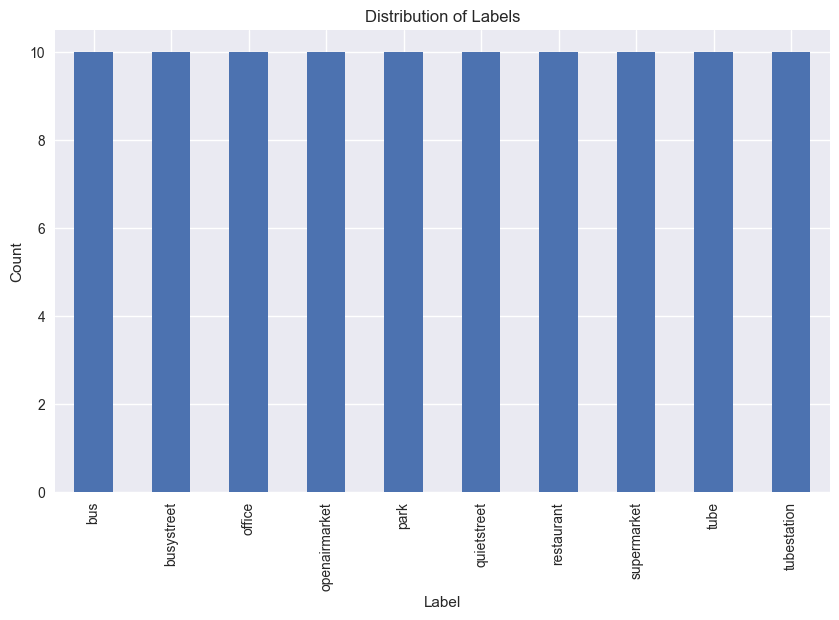

In [67]:
# We will then import the dataset 
directory = 'scenes_stereo'
file_list = [f for f in os.listdir(directory) if f.endswith('.wav')] # extractinf the files 
file_list.sort()
print(f"Number of files: {len(file_list)}") # check if they are all present

def extract_label(filename):
    # Since the filename is in the format "labelXX.wav":
    unique_label = filename.split('0')[0]  # Extract the label part
    unique_label = unique_label.split('1')[0]  # Extract the label part
    
    return unique_label

# Extract labels from filenames
labels = [extract_label(f) for f in file_list]

# Create a DataFrame with filenames and labels
df = pd.DataFrame({'filename': file_list, 'label': labels})

# Display the first few rows of the DataFrame
print(df.head())

# Check the distribution of labels
label_counts = df['label'].value_counts()
print(label_counts)

# Plot the distribution of labels
plt.figure(figsize=(10, 6))
label_counts.plot(kind='bar')
plt.title('Distribution of Labels')
plt.xlabel('Label')
plt.ylabel('Count')
plt.show()
    
    


The first step for developing our pipeline is to understand what feature extraction better suits our task, we will listen to some audio files and try different representation

File: openairmarket03.wav


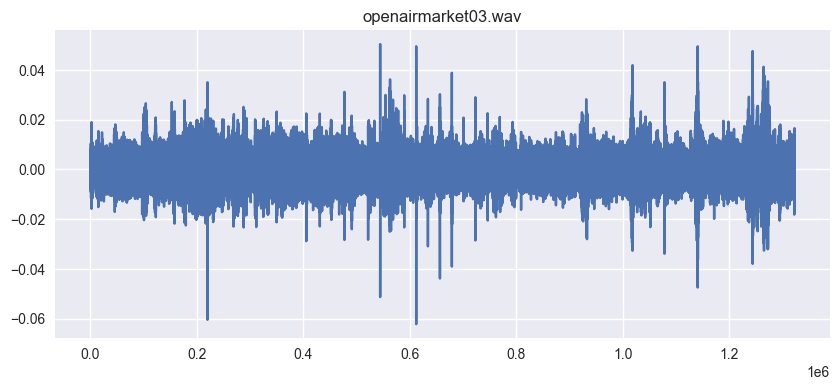

File: openairmarket04.wav


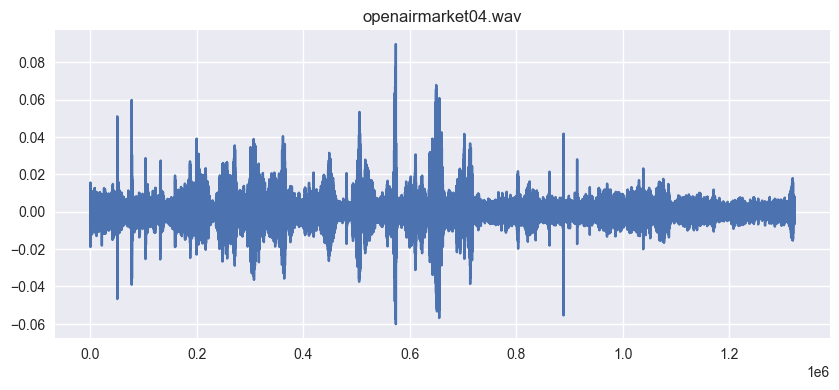

File: tubestation01.wav


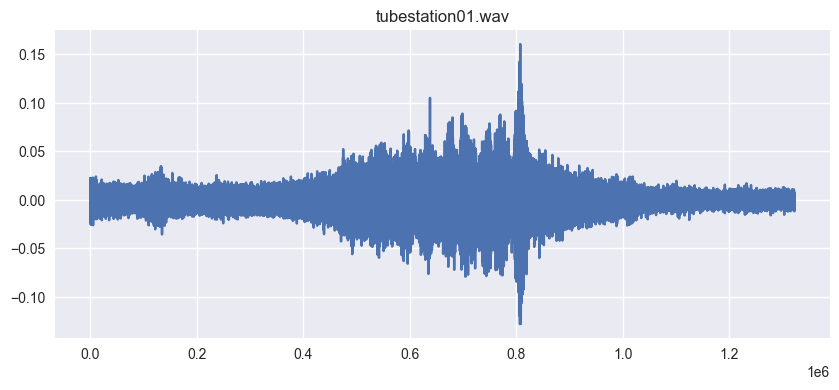

File: tube02.wav


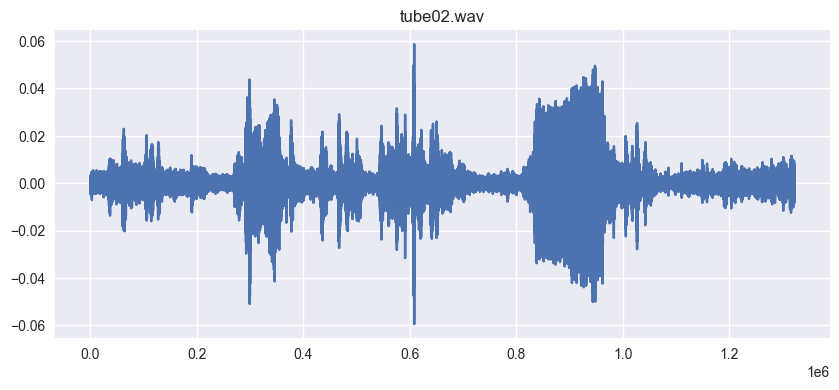

File: supermarket05.wav


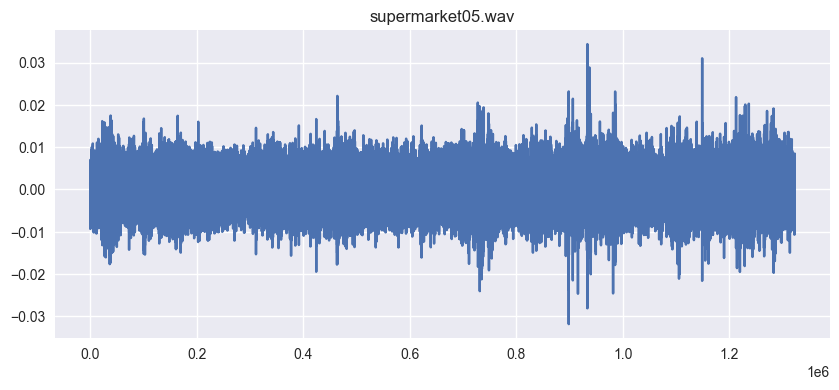

In [68]:
import random
from IPython.display import Audio, display

# First we listen to some random files 
random_files = random.sample(file_list, 5)

for file in random_files:
    file_path = os.path.join(directory, file)
    y, sr = librosa.load(file_path, sr=None)
    print(f"File: {file}")
    display(Audio(y, rate=sr))  # Play the audio
    plt.figure(figsize=(10, 4))
    plt.title(file)
    plt.plot(y)
    plt.show()



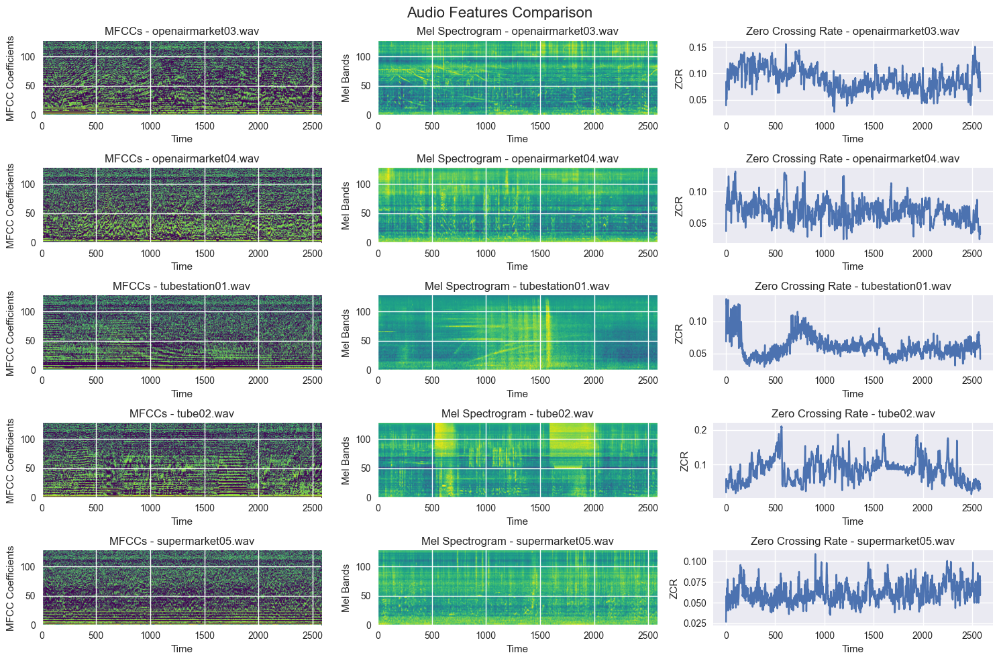

In [69]:
# We will then extract the features from the audio files and compare them

def extract_features(random_files):
    # Load the audio file
    y, sr = librosa.load(file_path, sr=None)
    
    # Extract features
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=128, n_fft=2048, hop_length=512, )
    mfccs = librosa.power_to_db(mfccs, ref=np.max)  # Convert to decibels
    mfccs = librosa.util.normalize(mfccs, axis=1)  # Normalize the MFCCs
    mel_spectrogram = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, n_fft=2048, hop_length=512)
    mel_spectrogram = librosa.util.normalize(mel_spectrogram, axis=1)  # Normalize the Mel Spectrogram
    zcr = librosa.feature.zero_crossing_rate(y)
    
    return mfccs, mel_spectrogram, zcr

# Extract features for all files
features_rnd = []

for file in random_files:
    file_path = os.path.join(directory, file)
    mfccs, mel_spectrogram, zcr = extract_features(file_path)
    features_rnd.append((mfccs, mel_spectrogram, zcr))

# Plot the the features in groups to compare them
def plot_features(features_rnd, random_files):
    fig, axs = plt.subplots(len(random_files), 3, figsize=(15, 10))
    fig.suptitle('Audio Features Comparison', fontsize=16)
    
    for i, (mfccs, mel_spectrogram, zcr) in enumerate(features_rnd):
        # Plot MFCCs
        axs[i, 0].imshow(mfccs, aspect='auto', origin='lower', cmap='viridis')
        axs[i, 0].set_title(f'MFCCs - {random_files[i]}')
        axs[i, 0].set_xlabel('Time')
        axs[i, 0].set_ylabel('MFCC Coefficients')
        
        # Plot Mel Spectrogram
        axs[i, 1].imshow(librosa.power_to_db(mel_spectrogram), aspect='auto', origin='lower', cmap='viridis')
        axs[i, 1].set_title(f'Mel Spectrogram - {random_files[i]}')
        axs[i, 1].set_xlabel('Time')
        axs[i, 1].set_ylabel('Mel Bands')
        
        # Plot Zero Crossing Rate
        axs[i, 2].plot(zcr[0])
        axs[i, 2].set_title(f'Zero Crossing Rate - {random_files[i]}')
        axs[i, 2].set_xlabel('Time')
        axs[i, 2].set_ylabel('ZCR')

    plt.tight_layout()
    plt.show()


plot_features(features_rnd, random_files)


The Mel Spectrogram seems to better represent the variation in the data so we're going to choose it

In [70]:
# Feature extraction for the entire dataset 
mels = []

# Extract features for all files
for file in file_list:
    file_path = os.path.join(directory, file)
    # Load the audio file first
    y, sr = librosa.load(file_path, sr=None)
    # Extract mel spectrogram
    mel_spectrogram = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, n_fft=2048, hop_length=512, )
    mel_spectrogram = librosa.util.normalize(mel_spectrogram, axis=1)  # Normalize the Mel Spectrogram
    mels.append(mel_spectrogram)


We will choose a hybrid model for the classification since the temporal information is crucial

Epoch 1/100


/opt/anaconda3/envs/tf310/lib/python3.10/site-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - accuracy: 0.1354 - loss: 3.0901 - val_accuracy: 0.2500 - val_loss: 2.2202
Epoch 2/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step - accuracy: 0.4479 - loss: 1.6597 - val_accuracy: 0.1875 - val_loss: 2.2260
Epoch 3/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step - accuracy: 0.5938 - loss: 1.1369 - val_accuracy: 0.1250 - val_loss: 2.2248
Epoch 4/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step - accuracy: 0.7396 - loss: 0.8797 - val_accuracy: 0.1250 - val_loss: 2.1922
Epoch 5/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step - accuracy: 0.8854 - loss: 0.5680 - val_accuracy: 0.1250 - val_loss: 2.1955
Epoch 6/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step - accuracy: 0.9167 - loss: 0.3862 - val_accuracy: 0.1250 - val_loss: 2.1852
Epoch 7/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step - accuracy: 0.9375 - loss: 0.4000 - val_accuracy: 0.1875 - val_loss: 2.1683
Epoch 8/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step - accuracy: 0.9792 - loss: 0.1623 - val_accuracy: 0.1875 - val_loss: 2.151

/opt/anaconda3/envs/tf310/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/tf310/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/tf310/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


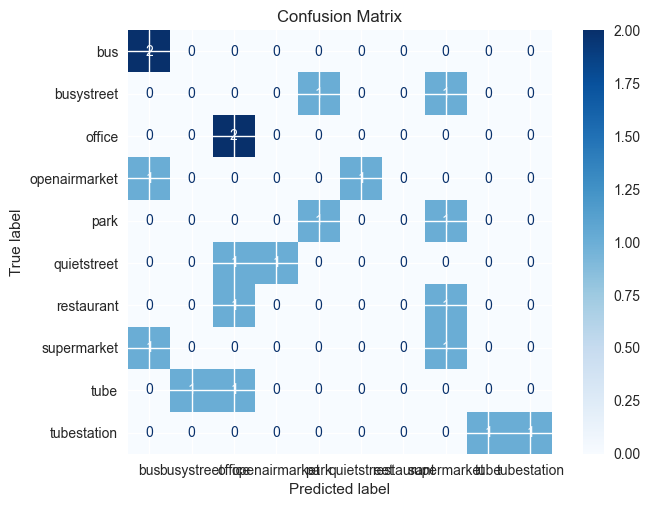

Accuracy: 35.00%


In [71]:
# We first neet to prepare the data for our hybrid model

def prepare_data(mels, labels, max_timesteps=None, test_size=0.2, random_state=42):
    # Encode labels
    label_encoder = LabelEncoder()
    y = label_encoder.fit_transform(labels)
    y_cat = tf.keras.utils.to_categorical(y)

    X = np.array(mels)  # Shape: (samples, time, features)

    # Standardize across all time features 
    samples, time_steps, n_features = X.shape
    scaler = StandardScaler()
    X_reshaped = X.reshape(samples, -1)
    X_scaled = scaler.fit_transform(X_reshaped)
    X_scaled = X_scaled.reshape(samples, time_steps, n_features)

    # Split into train/test
    X_train, X_test, y_train, y_test = train_test_split(
        X_scaled, y, test_size=test_size, random_state=random_state, stratify=y
    )

    return X_train, X_test, y_train, y_test, y_cat.shape[1], label_encoder

# Define the hybrid model
def create_timedistributed_lstm_model(time_steps, features_per_step, num_classes):
    model = tf.keras.Sequential([
        tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(128, activation='relu'), input_shape=(time_steps, features_per_step)),
        tf.keras.layers.TimeDistributed(tf.keras.layers.BatchNormalization()),
        tf.keras.layers.TimeDistributed(tf.keras.layers.Dropout(0.2)),

        tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(128, return_sequences=False)),
        tf.keras.layers.Dropout(0.2),

        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dropout(0.2),

        tf.keras.layers.Dense(num_classes, activation='softmax')
    ])

    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Prepare the data
X_train, X_test, y_train, y_test, num_classes, label_encoder = prepare_data(mels, labels)

# Create the model
time_steps = X_train.shape[1]
features_per_step = X_train.shape[2]
model = create_timedistributed_lstm_model(time_steps, features_per_step, num_classes)

# Train the model
y_train_cat = tf.keras.utils.to_categorical(y_train, num_classes=num_classes)
history = model.fit(X_train, y_train_cat, epochs=100, batch_size=32, validation_split=0.2, verbose=1)

# Evaluate the model
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)

# Print classification report
print(classification_report(y_test, y_pred_classes, target_names=label_encoder.classes_))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred_classes)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=label_encoder.classes_)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()

# Accuracy
accuracy = accuracy_score(y_test, y_pred_classes)
print(f"Accuracy: {accuracy * 100:.2f}%")





From the confusion matrix and accuracy we can see that the model is performing very well on the training sat but poorly on the test set, this is a clear sign of overfitting, we can try to fragment our dataset as a data augmentation technique

Number of original files: 100
Number of segments after fragmentation: 1000
Label distribution in the fragmented data:
label
bus              100
busystreet       100
office           100
openairmarket    100
park             100
quietstreet      100
restaurant       100
supermarket      100
tube             100
tubestation      100
Name: count, dtype: int64


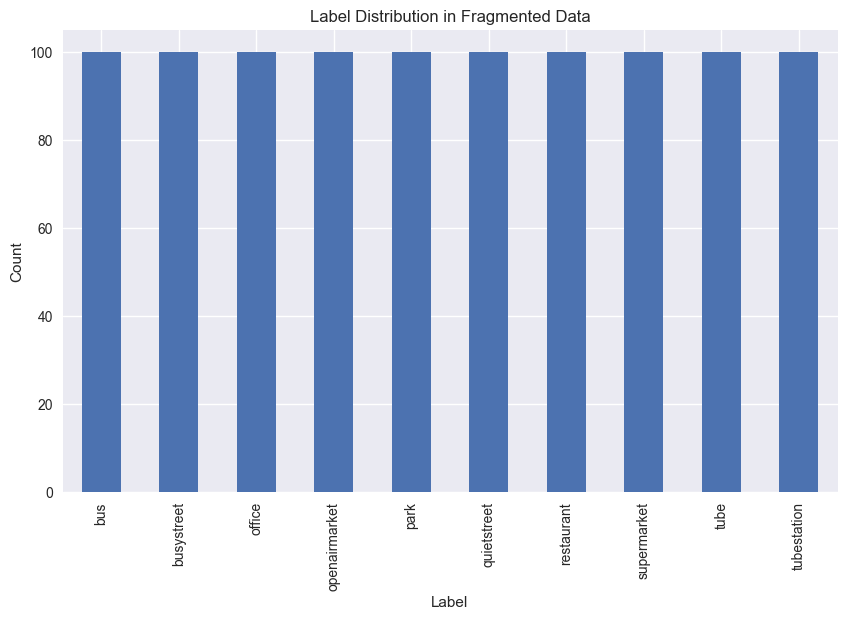

Epoch 1/100


/opt/anaconda3/envs/tf310/lib/python3.10/site-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 14s 189ms/step - accuracy: 0.1497 - loss: 2.9668 - val_accuracy: 0.1937 - val_loss: 2.0933
Epoch 2/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - accuracy: 0.3934 - loss: 1.8668 - val_accuracy: 0.1937 - val_loss: 2.0922
Epoch 3/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - accuracy: 0.4577 - loss: 1.6229 - val_accuracy: 0.2438 - val_loss: 2.0323
Epoch 4/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - accuracy: 0.5849 - loss: 1.2362 - val_accuracy: 0.2812 - val_loss: 2.0190
Epoch 5/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 4s 198ms/step - accuracy: 0.7350 - loss: 0.8948 - val_accuracy: 0.2875 - val_loss: 1.9979
Epoch 6/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 5s 250ms/step - accuracy: 0.7595 - loss: 0.8124 - val_accuracy: 0.2937 - val_loss: 1.9662
Epoch 7/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 5s 248ms/step - accuracy: 0.8066 - loss: 0.6362 - val_accuracy: 0.2812 - val_loss: 1.9965
Epoch 8/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 5s 251ms/step - accuracy: 0.8875 - loss: 0.4024 - val_accuracy: 0.287

<Figure size 1000x800 with 0 Axes>

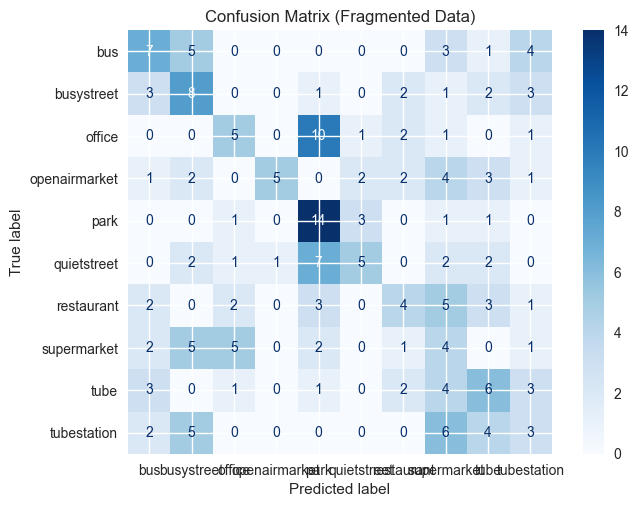

Accuracy (Fragmented Data): 30.50%


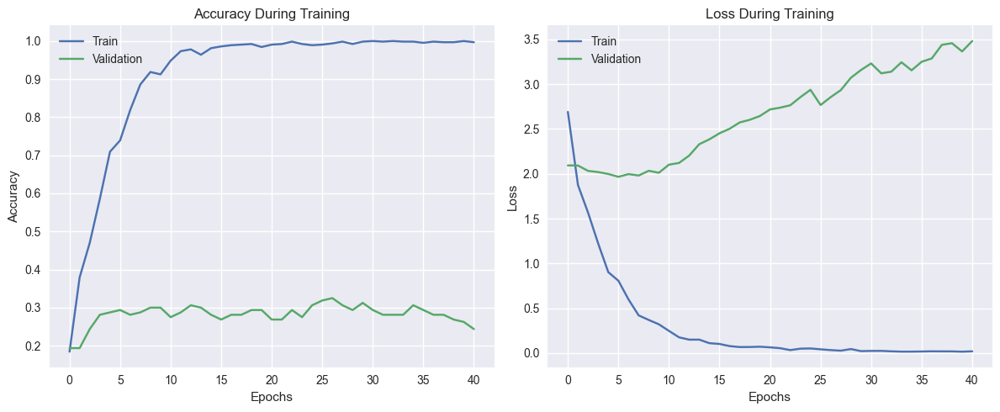


Performance comparison:
Original model - Accuracy: 35.00%
Model with fragmented data - Accuracy: 30.50%


In [73]:
# Fragment the dataset into 3-second segments
fragmented_mels = []
fragmented_labels = []

for file_idx, file in enumerate(file_list):
    file_path = os.path.join(directory, file)
    # Load the audio file
    y, sr = librosa.load(file_path, sr=None)
    
    # Calculate the segment length in samples (3 seconds)
    segment_duration = 3  # seconds
    segment_length = int(segment_duration * sr)
    
    # Fragment the audio into 3-second segments
    for start in range(0, len(y), segment_length):
        # Check if the segment is complete (at least 3 seconds)
        if start + segment_length <= len(y):
            segment = y[start:start + segment_length]
            
            # Calculate mel spectrogram for this segment
            mel_segment = librosa.feature.melspectrogram(y=segment, sr=sr, n_mels=128, n_fft=2048, hop_length=512)
            mel_segment = librosa.util.normalize(mel_segment, axis=1)  # Normalize the Mel Spectrogram
            
            # Add to the list of fragments
            fragmented_mels.append(mel_segment)
            fragmented_labels.append(labels[file_idx])

# Display information about the fragmented data
print(f"Number of original files: {len(file_list)}")
print(f"Number of segments after fragmentation: {len(fragmented_mels)}")

# Distribution of labels in the fragmented data
fragmented_df = pd.DataFrame({'label': fragmented_labels})
fragmented_label_counts = fragmented_df['label'].value_counts()
print("Label distribution in the fragmented data:")
print(fragmented_label_counts)

# Visualize the distribution
plt.figure(figsize=(10, 6))
fragmented_label_counts.plot(kind='bar')
plt.title('Label Distribution in Fragmented Data')
plt.xlabel('Label')
plt.ylabel('Count')
plt.show()

# Train the model again using the fragmented data
# Prepare the data
X_train_frag, X_test_frag, y_train_frag, y_test_frag, num_classes_frag, label_encoder_frag = prepare_data(fragmented_mels, fragmented_labels)

# Create the model
time_steps_frag = X_train_frag.shape[1]
features_per_step_frag = X_train_frag.shape[2]
model_frag = create_timedistributed_lstm_model(time_steps_frag, features_per_step_frag, num_classes_frag)

# Train the model
y_train_cat_frag = tf.keras.utils.to_categorical(y_train_frag, num_classes=num_classes_frag)
history_frag = model_frag.fit(
    X_train_frag, 
    y_train_cat_frag, 
    epochs=100, 
    batch_size=32, 
    validation_split=0.2, 
    verbose=1,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=35,
            restore_best_weights=True
        )
    ]
)

# Evaluate the model
y_pred_frag = model_frag.predict(X_test_frag)
y_pred_classes_frag = np.argmax(y_pred_frag, axis=1)

# Print classification report
print("Classification report for the model trained on fragmented data:")
print(classification_report(y_test_frag, y_pred_classes_frag, target_names=label_encoder_frag.classes_))

# Confusion matrix
cm_frag = confusion_matrix(y_test_frag, y_pred_classes_frag)
disp_frag = ConfusionMatrixDisplay(confusion_matrix=cm_frag, display_labels=label_encoder_frag.classes_)
plt.figure(figsize=(10, 8))
disp_frag.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix (Fragmented Data)')
plt.show()

# Accuracy
accuracy_frag = accuracy_score(y_test_frag, y_pred_classes_frag)
print(f"Accuracy (Fragmented Data): {accuracy_frag * 100:.2f}%")

# Visualize training progress
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history_frag.history['accuracy'], label='Train')
plt.plot(history_frag.history['val_accuracy'], label='Validation')
plt.title('Accuracy During Training')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history_frag.history['loss'], label='Train')
plt.plot(history_frag.history['val_loss'], label='Validation')
plt.title('Loss During Training')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

# Compare the original and fragmented models
print("\nPerformance comparison:")
print(f"Original model - Accuracy: {accuracy * 100:.2f}%")
print(f"Model with fragmented data - Accuracy: {accuracy_frag * 100:.2f}%")